# @CristiDatas - main.ipynb

# Proyecto Covid - Agosto 2020. The Bridge. Data Science.

<img src="../resources/images/covid.png">

Proyecto EDA (Exploratory Data Analysis) de agosto 2020 para el bootcamp de Data Science Full Time de The Bridge.

Se forman varios equipos en clase y a cada uno se le asignan varios países para realizar EDA cumpliendo unos requisitos específicos para el proyecto y respondiendo a unas preguntas concretas. 

En nuestro grupo los países asignados son:
* Francia
* India
* Perú
* España
* Estados Unidos

## OPCIÓN A

Cada proyecto puede optar a una opción según criterios de evaluación; partiendo de C, que sería la más básica.

Con este archivo, alcanzamos la Opción A, una opción de dificultad alta, dado que el bootcamp comienza el 15 de junio (sin ningún conocimiento de Python ni programación) y este proyecto se realiza en agosto.


&nbsp;

>Option A

>1. Research to save each plot in local files. Save them on different folders for each country.

>2. Use distribute modules for each functionality. The jupyter notebooks must not have any loop or function definitions. It only must have the initials imports and the call to necessary functions.

&nbsp;

### Las funciones de visualización automatizan la generación de los gráficos asignando un color concreto a cada país, los muestran en pantalla y los guardan con nombres personalizados en sus correspondientes carpetas. De esta manera, por ejemplo, una sola función es capaz de generar 60 gráficos y guardar cada uno con su nombre en su carpeta, con un solo click



---

## Archivo Jupyter Notebook de importación de módulos y llamadas a funciones @CristiDatas

---
 
### Añadimos al sys.path la ruta de la carpeta utils para que se puedan importar los módulos:

In [17]:
import sys
sys.path.append("../src/utils")

### Importamos bibliotecas:

In [18]:
import pandas as pd
import datetime
import matplotlib.pyplot as plt
import seaborn as sns

# Importación de módulos específicos del proyecto. Estos módulos se encuentran dentro de la carpeta utils, dentro de src. Allí se puede ver el código de cada función.

import folders_tb as fd
import mining_data_tb as mng
import visualization_tb as vsn

# Especificaciones para gráficos: @CristiDatas

sns.set()
#colores_paises = ["dodgerblue","red","g","magenta","darkorange"]
colores_paises={"France":"dodgerblue","India":"red","Peru":"g", "Spain":"magenta","United States":"darkorange"}

"""
Función graf_a(graf) de visualization_tb
OUTPUT: gráfico generado a partir de un json extraído de otro grupo de clase (un punto básico del proyecto):
"""

'\nFunción graf_a(graf) de visualization_tb\nOUTPUT: gráfico generado a partir de un json extraído de otro grupo de clase (un punto básico del proyecto):\n'

### Función open_csv de folders_tb para abrir el dataset.
En cada llamada a la función (actualizándose cada vez) accedemos a la web donde se alojan los datos sobre Covid, convertimos el archivo csv con los datos en nuestro dataframe **csv_df** y establecemos que el campo *date* es tipo fecha:

In [19]:
csv_df = fd.open_csv(url="https://covid.ourworldindata.org/data/owid-covid-data.csv")

### Función seleccion_paises de mining_data para seleccionar los países a analizar por nuestro grupo.

In [20]:
df=mng.seleccion_paises(dataframe=csv_df,paises=["India","Peru","United States","France","Spain"])
#df.replace({"United States": "USA"})
df.shape

(1540, 49)

### Función borrar_previo de mining_data para buscar cuándo fue el primer caso y borrar las fechas anteriores.
Los datos siempre están actualizados.

In [21]:
df=mng.borrar_previo(dataframe=df)
df.shape

(1456, 49)

### Función cero_nan de mining_data para cambiar los valores Nan por ceros.

In [22]:
df=mng.cero_nan(dataframe=df)

### Función seleccion_columnas de mining_data para seleccionar las columnas a analizar.

In [23]:
df=mng.seleccion_columnas(dataframe=df,col1=2,col2=15)
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1456 entries, 2020-01-21 to 2020-11-14
Data columns (total 13 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   location                         1456 non-null   object 
 1   total_cases                      1456 non-null   float64
 2   new_cases                        1456 non-null   float64
 3   new_cases_smoothed               1456 non-null   float64
 4   total_deaths                     1456 non-null   float64
 5   new_deaths                       1456 non-null   float64
 6   new_deaths_smoothed              1456 non-null   float64
 7   total_cases_per_million          1456 non-null   float64
 8   new_cases_per_million            1456 non-null   float64
 9   new_cases_smoothed_per_million   1456 non-null   float64
 10  total_deaths_per_million         1456 non-null   float64
 11  new_deaths_per_million           1456 non-null   float64
 12  ne

# VISUALIZACIÓN DE DATOS

### Función paises_juntos de visualization_tb para comparar la evolución a lo largo del tiempo de cada columna en todos los países del grupo a la vez.

Esta función automatiza el proceso para analizar cada feature. Genera los 12 gráficos, los muestra y los guarda en los 12 archivos correspondientes.

Primero hace una pivot table de cada columna (mediante un for), luego muestra cada gráfico y por último los guarda como archivos en la carpeta paises_juntos, de plots, dentro de resources, dándole un nombre descriptivo a cada archivo. Cada vez que se ejecuta sobreescribe los archivos para actualizar. La función toma como parámetros el dataframe a analizar y el diccionario con los colores correspondientes a cada país.


 total_cases 



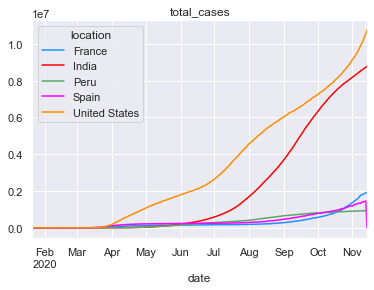


 new_cases 



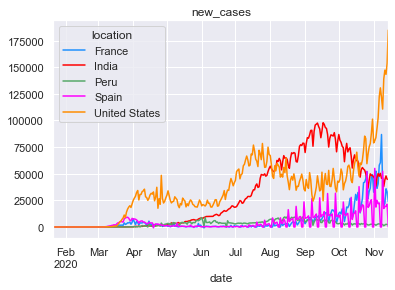


 new_cases_smoothed 



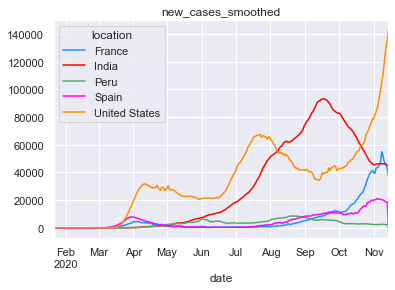


 total_deaths 



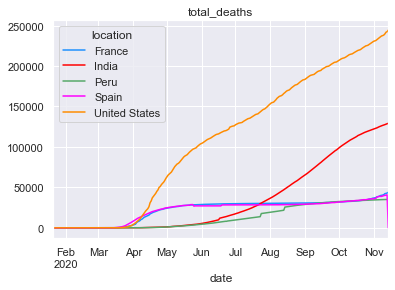


 new_deaths 



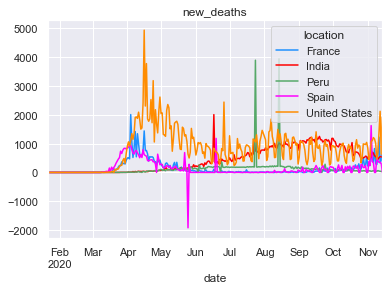


 new_deaths_smoothed 



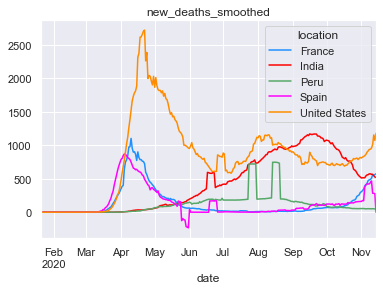


 total_cases_per_million 



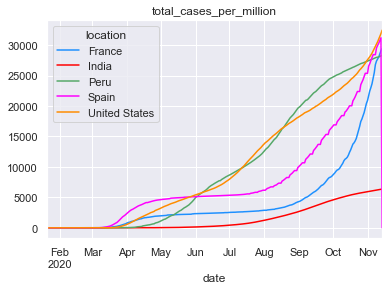


 new_cases_per_million 



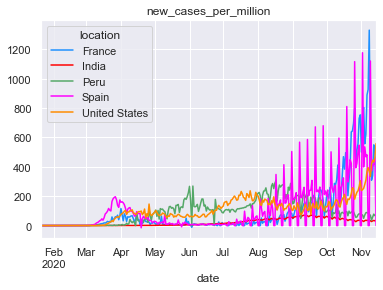


 new_cases_smoothed_per_million 



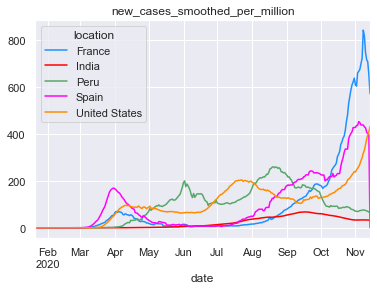


 total_deaths_per_million 



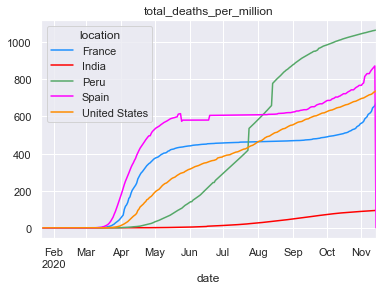


 new_deaths_per_million 



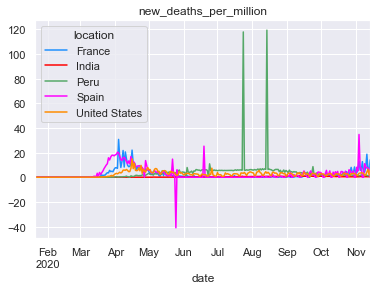


 new_deaths_smoothed_per_million 



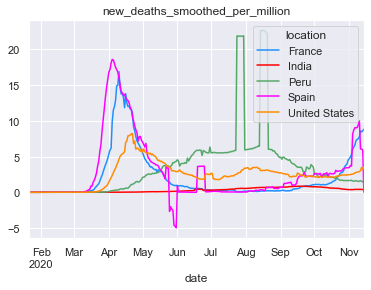

In [24]:
vsn.paises_juntos(dataframe=df,colores_paises=colores_paises)

### Función paises_juntos_mes de visualization_tb:
Igual que función paises_juntos pero cambiando la frecuencia a mensual y haciendo una media aritmética de los valores, con lo que los outliers provocados por los ajustes quedan repartidos entre el resto de los datos y las curvas se suavizan. Cada gráfico se muestra en pantalla y luego se guarda en la misma carpeta de paises_juntos pero agregando el sufijo "_mes".

Esta función también automatiza el proceso para analizar cada feature. Genera los 12 gráficos, los muestra y los guarda en los 12 archivos correspondientes.


 total_cases 



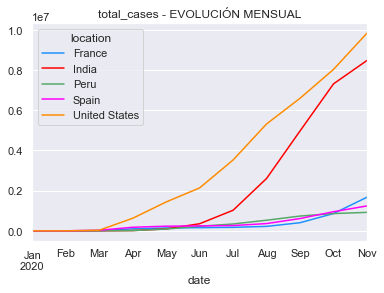


 new_cases 



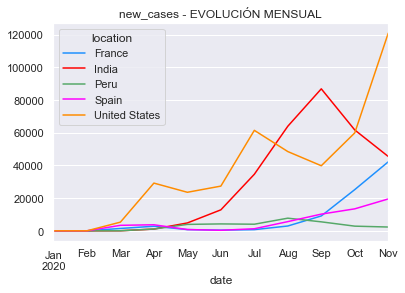


 new_cases_smoothed 



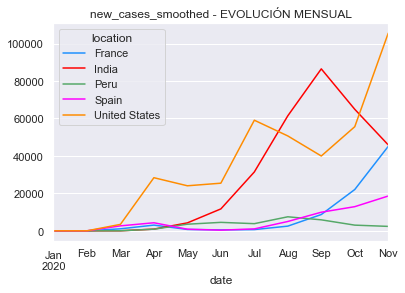


 total_deaths 



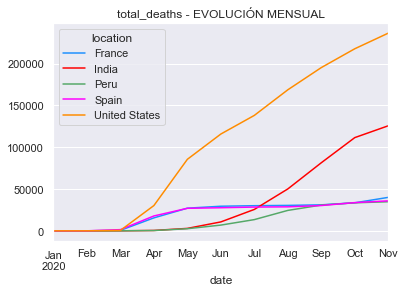


 new_deaths 



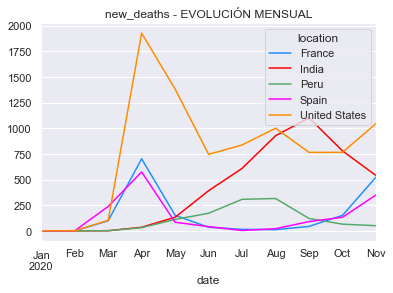


 new_deaths_smoothed 



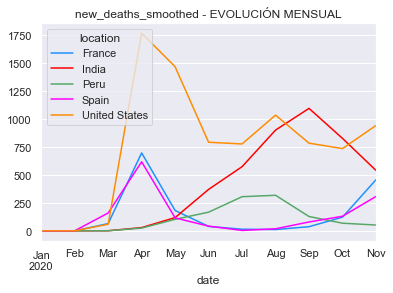


 total_cases_per_million 



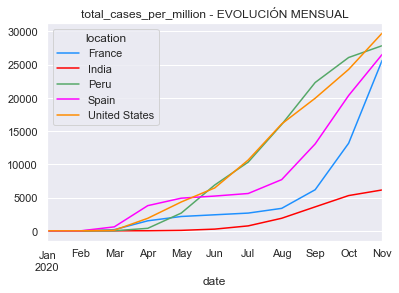


 new_cases_per_million 



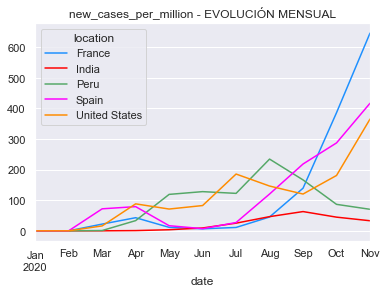


 new_cases_smoothed_per_million 



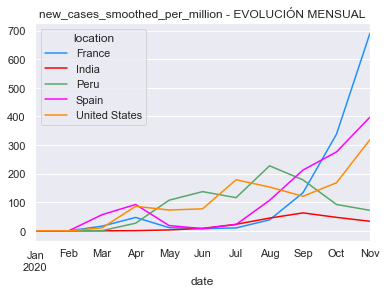


 total_deaths_per_million 



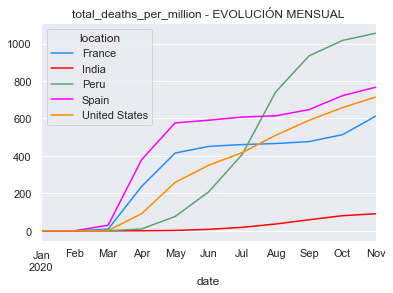


 new_deaths_per_million 



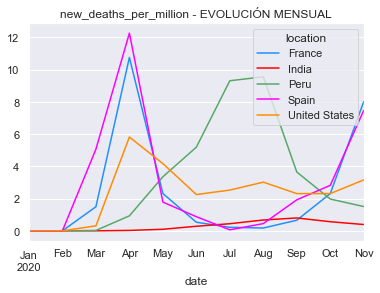


 new_deaths_smoothed_per_million 



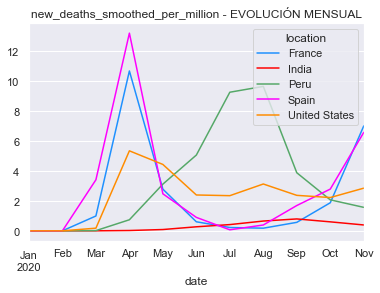

In [25]:
vsn.paises_juntos_mes(dataframe=df,colores_paises=colores_paises)

### Función emergencias de visualization_tb para ver las diferentes tendencias de cada columna para cada país en relación a la declaración del estado de alarma.
Esta función también automatiza el proceso para analizar cada feature. Genera los 60 gráficos, los muestra y los guarda en 60 archivos, cada uno dentro de la carpeta correspondiente a cada país.

Se muestra verticalmente el inicio y el fin del estado de alarma (si lo hay). Para ello usamos las columnas seleccionadas como una lista que recorremos y dentro de ésta usamos la pivot table de paises_juntos para recorrer cada país.

Para las líneas verticales usamos una lista con las fechas de los estados de emergencia (que hemos documentado en *documentation*) y la recorremos para trazar las líneas y el título.

Primero muestra cada gráfico agrupados por columnas y después por países y después guarda los gráficos de cada país en su carpeta correspondiente dentro de la carpeta plots de resources.

La función toma como parámetros el dataframe que analizamos, las fechas de emergencia (para poder variarlas sin entrar en el módulo) y el diccionario con los colores correspondientes a cada país. Cada vez que se ejecuta sobreescribe los archivos para actualizar.


 total_cases 


 France 



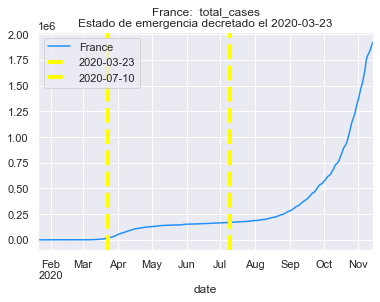


 India 



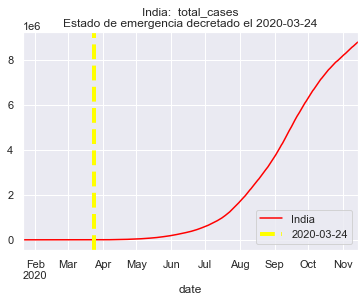


 Peru 



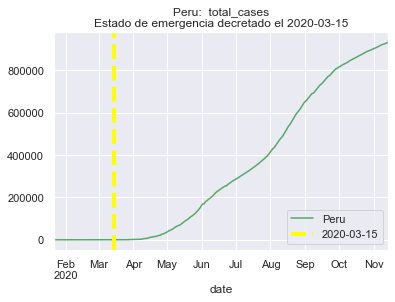


 Spain 



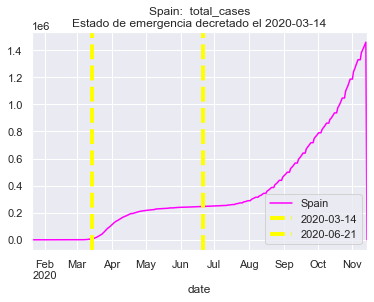


 United States 



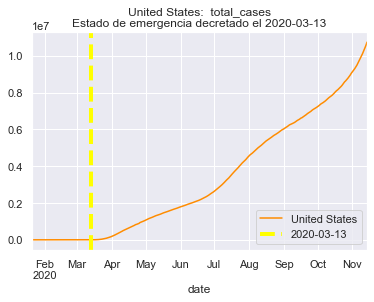


 new_cases 


 France 



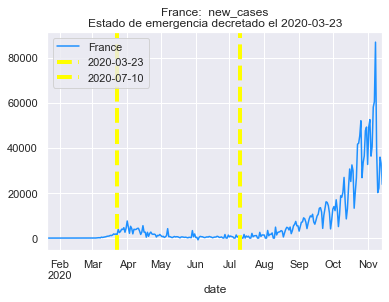


 India 



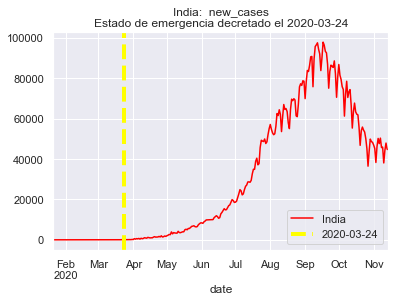


 Peru 



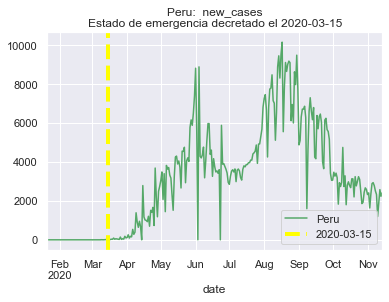


 Spain 



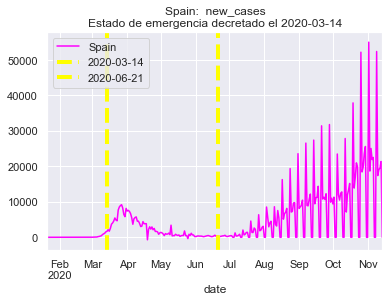


 United States 



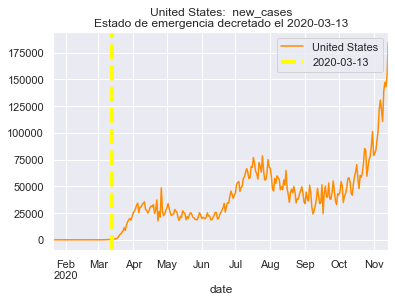


 new_cases_smoothed 


 France 



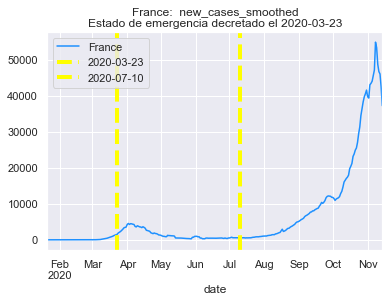


 India 



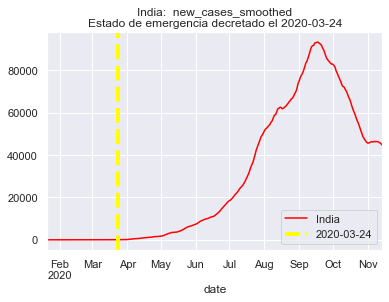


 Peru 



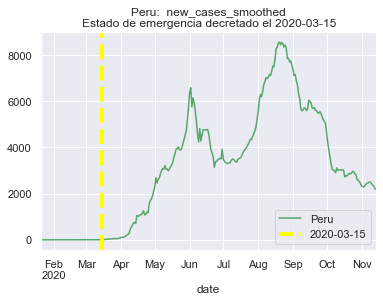


 Spain 



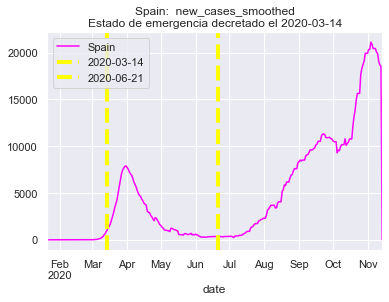


 United States 



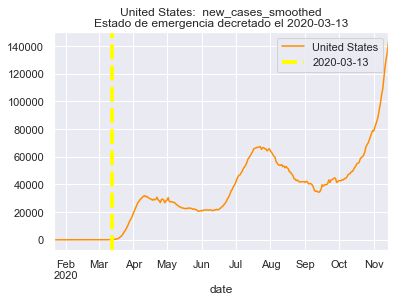


 total_deaths 


 France 



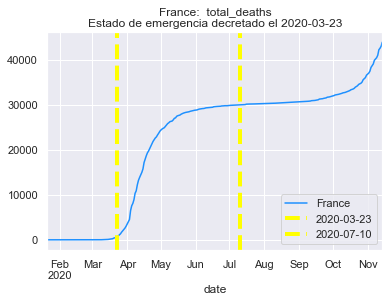


 India 



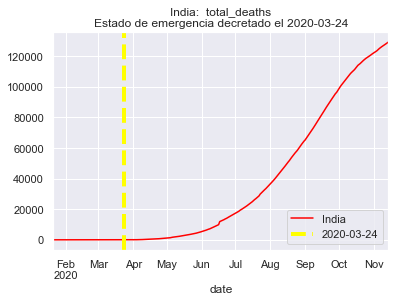


 Peru 



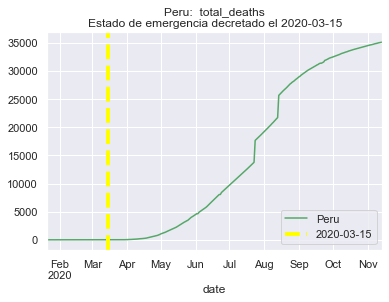


 Spain 



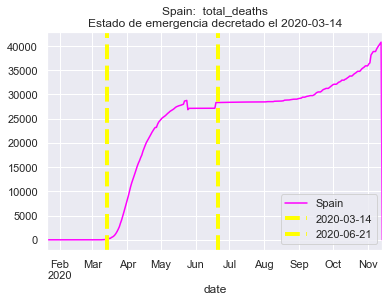


 United States 



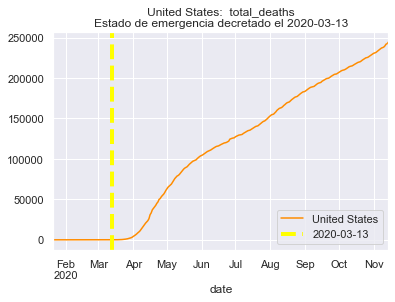


 new_deaths 


 France 



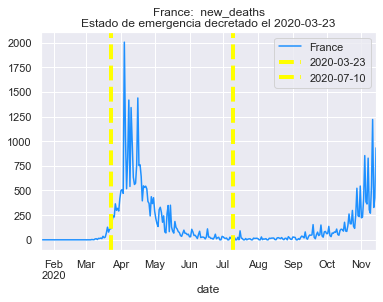


 India 



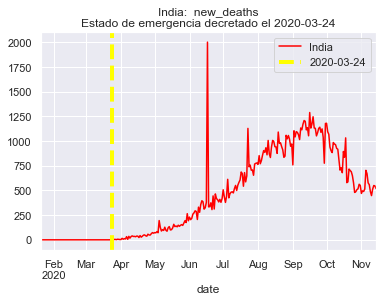


 Peru 



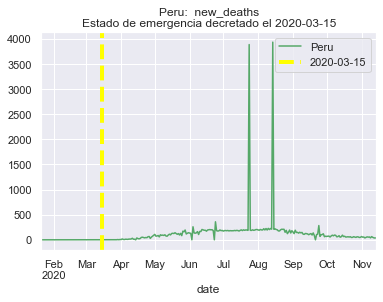


 Spain 



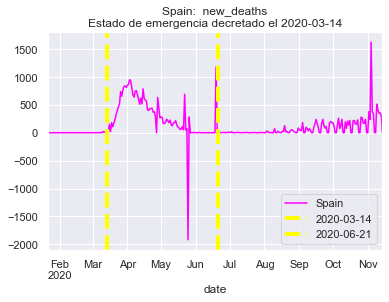


 United States 



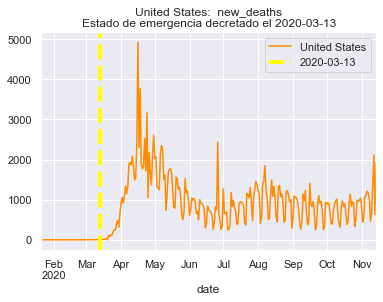


 new_deaths_smoothed 


 France 



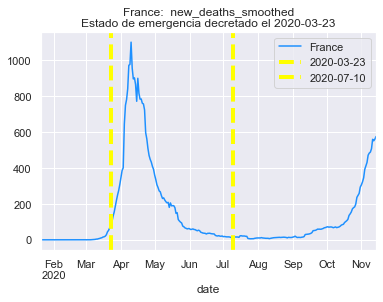


 India 



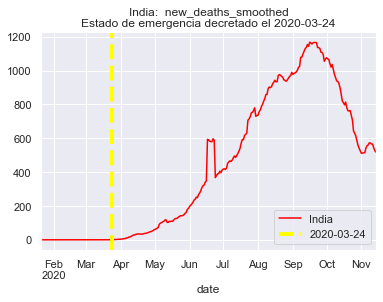


 Peru 



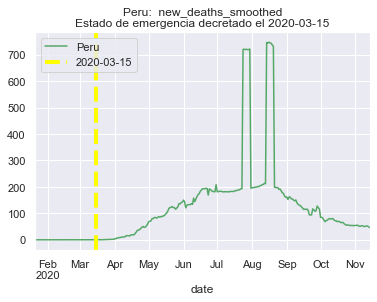


 Spain 



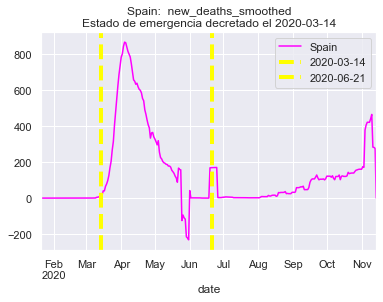


 United States 



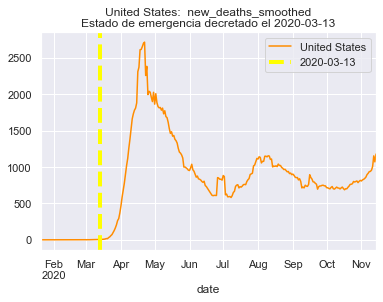


 total_cases_per_million 


 France 



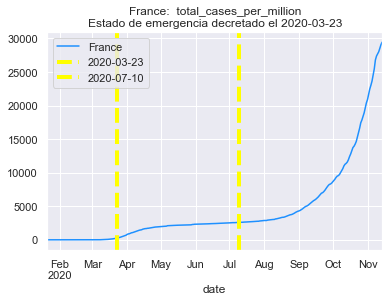


 India 



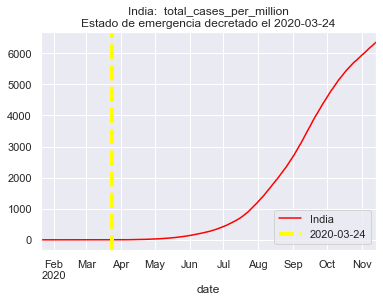


 Peru 



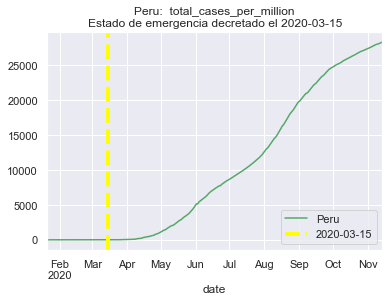


 Spain 



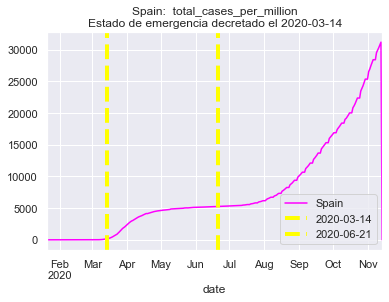


 United States 



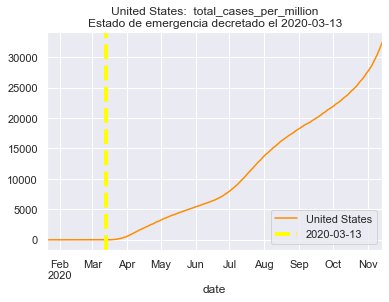


 new_cases_per_million 


 France 



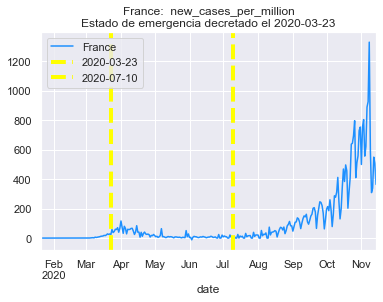


 India 



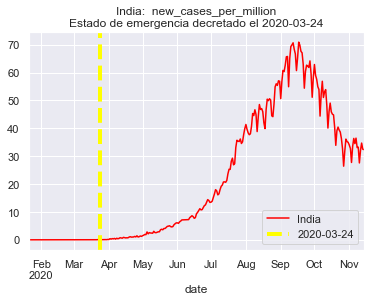


 Peru 



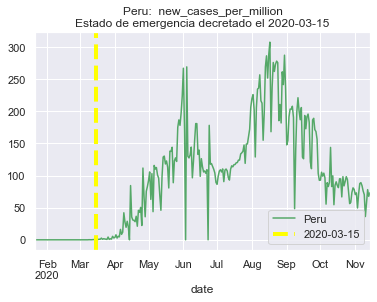


 Spain 



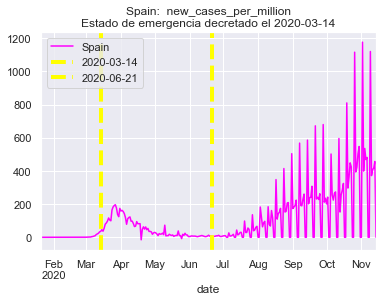


 United States 



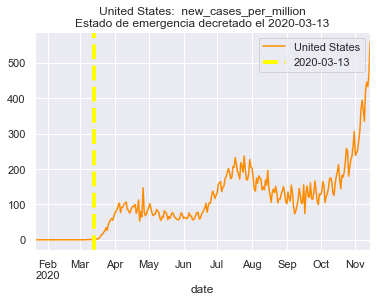


 new_cases_smoothed_per_million 


 France 



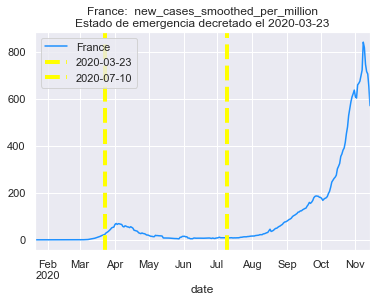


 India 



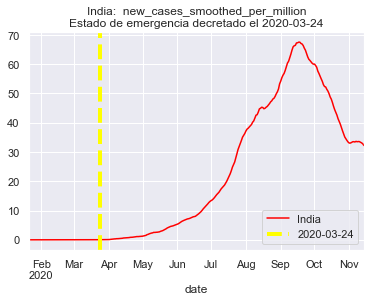


 Peru 



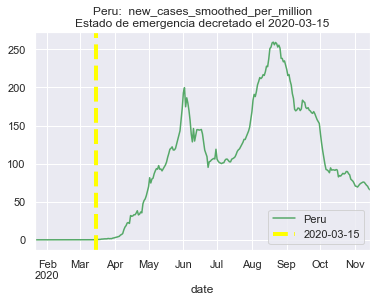


 Spain 



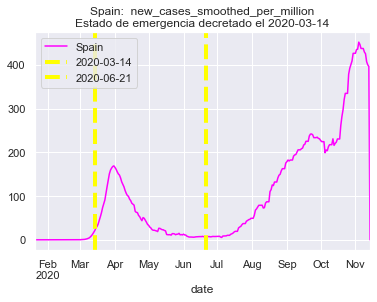


 United States 



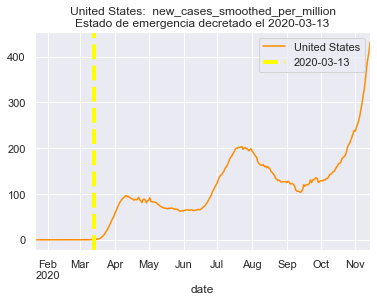


 total_deaths_per_million 


 France 



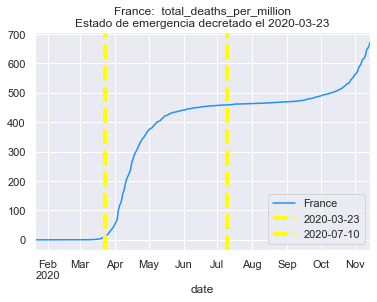


 India 



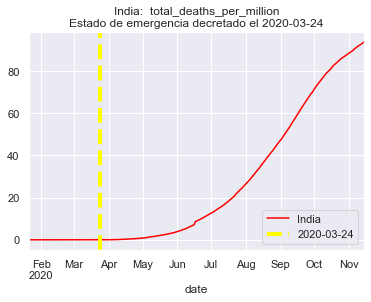


 Peru 



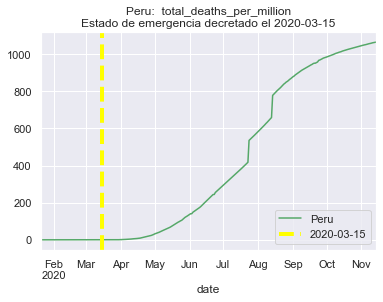


 Spain 



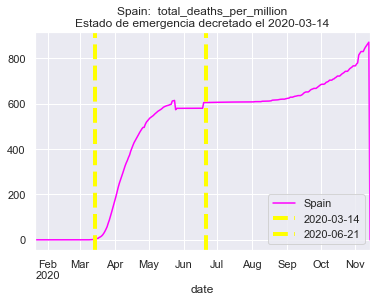


 United States 



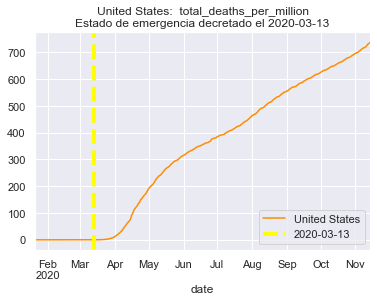


 new_deaths_per_million 


 France 



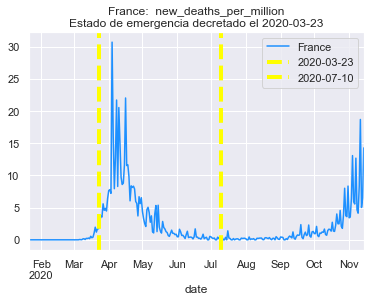


 India 



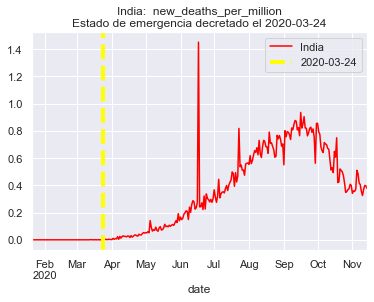


 Peru 



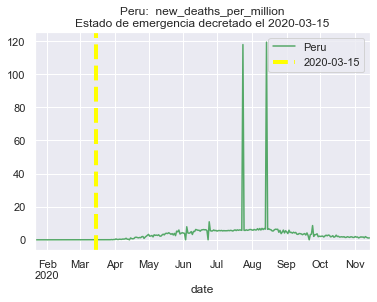


 Spain 



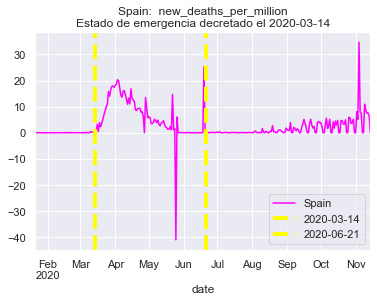


 United States 



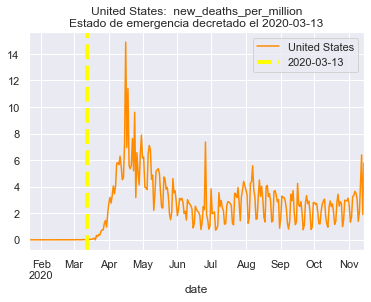


 new_deaths_smoothed_per_million 


 France 



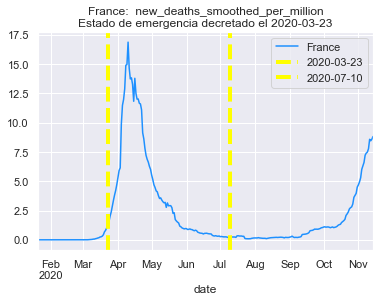


 India 



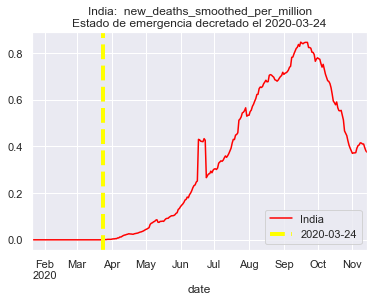


 Peru 



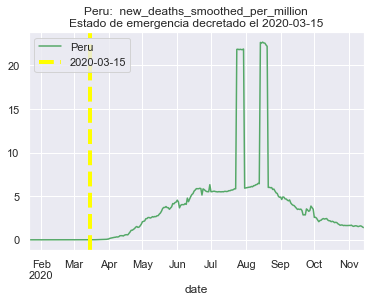


 Spain 



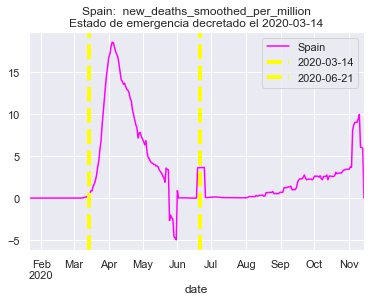


 United States 



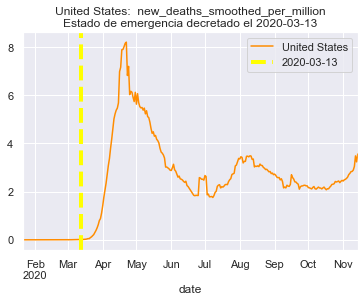

In [26]:
fechas_emergencia = [["2020-03-23","2020-07-10"],["2020-03-24"],["2020-03-15"],["2020-03-14","2020-06-21"],["2020-03-13"]]
vsn.emergencias(dataframe=df,emergencia=fechas_emergencia,colores_paises=colores_paises) 

### Función emergencias_mes: igual que función emergencias pero cambiando la frecuencia a mensual y haciendo una media aritmética de esos valores.
Con este procedimiento, los outliers provocados por los ajustes quedan repartidos entre el resto de los datos y las curvas se suavizan.

Esta función también automatiza el proceso para analizar cada feature. Genera los 60 gráficos, los muestra y los guarda en 60 archivos agregando el sufijo "_mes", cada uno dentro de la carpeta correspondiente a cada país.



 total_cases 


 France 



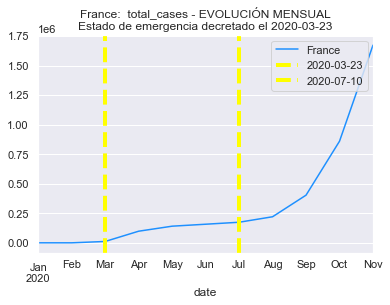


 India 



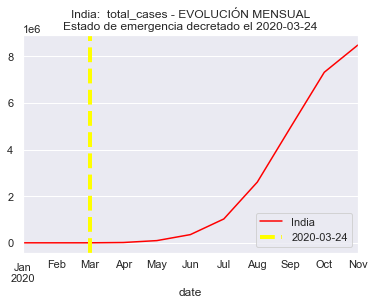


 Peru 



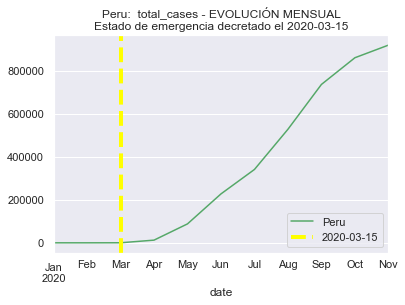


 Spain 



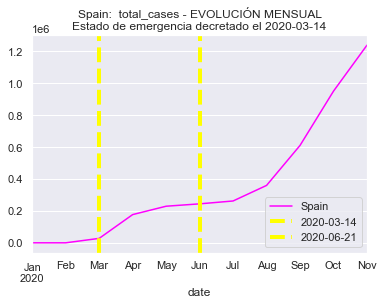


 United States 



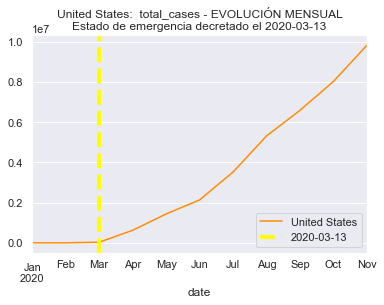


 new_cases 


 France 



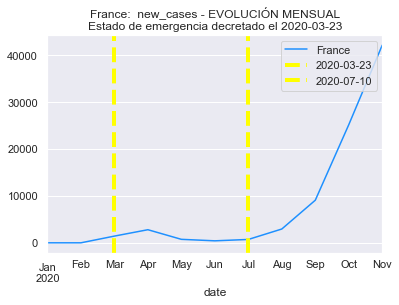


 India 



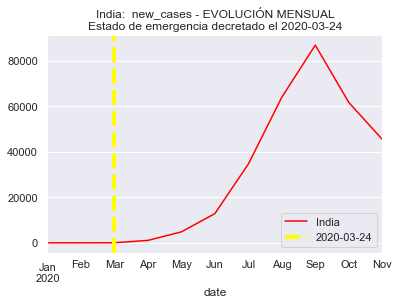


 Peru 



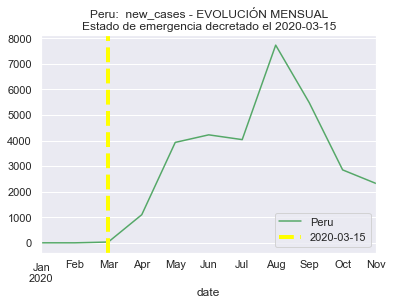


 Spain 



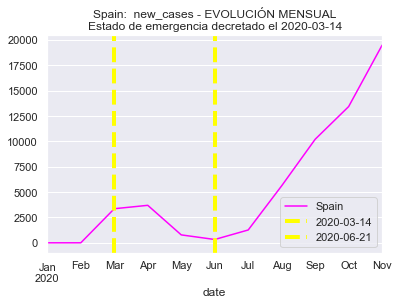


 United States 



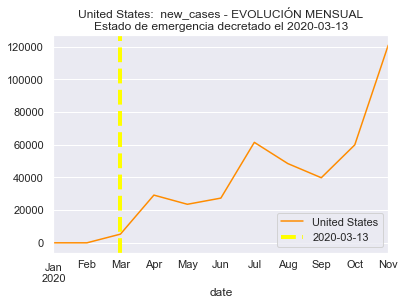


 new_cases_smoothed 


 France 



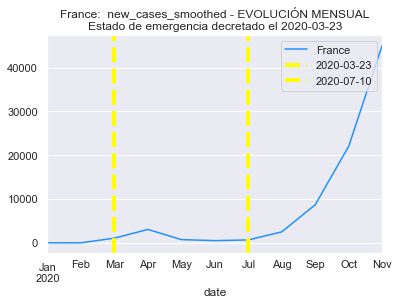


 India 



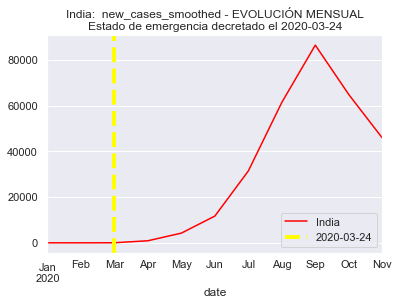


 Peru 



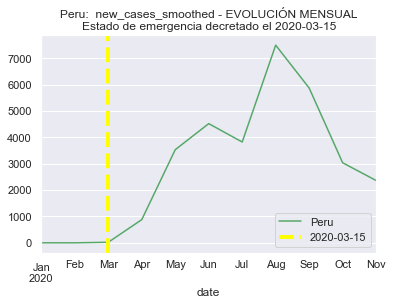


 Spain 



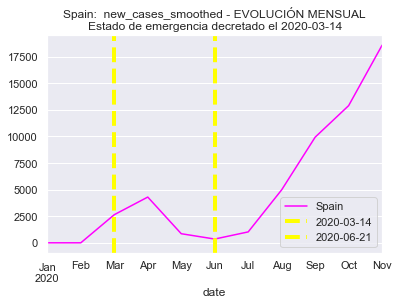


 United States 



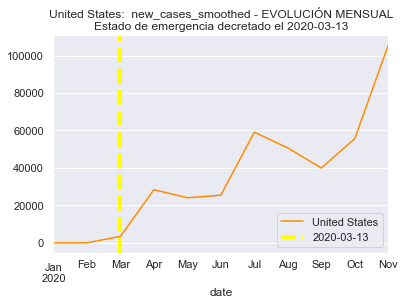


 total_deaths 


 France 



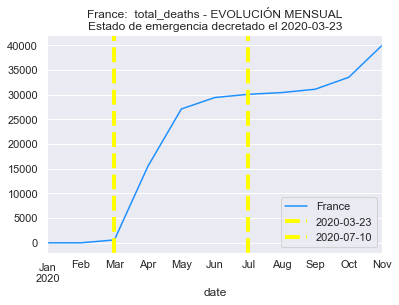


 India 



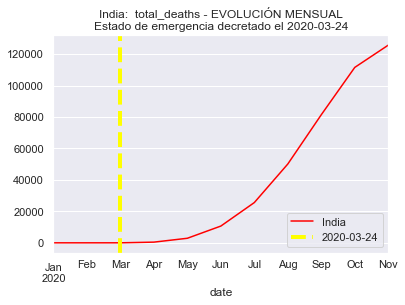


 Peru 



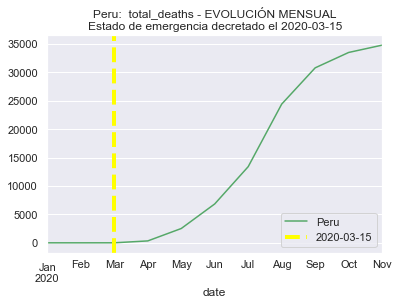


 Spain 



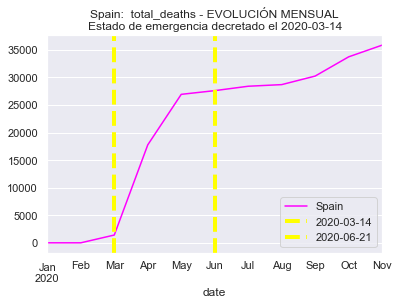


 United States 



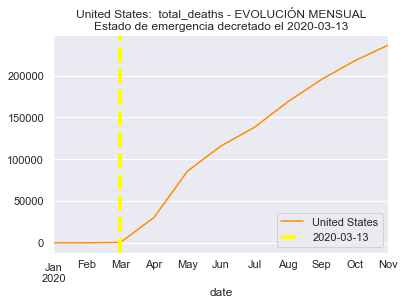


 new_deaths 


 France 



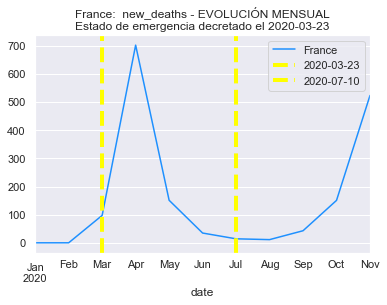


 India 



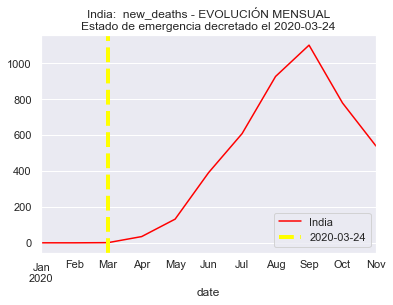


 Peru 



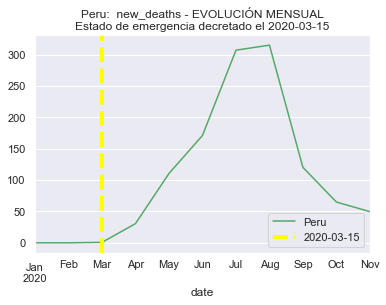


 Spain 



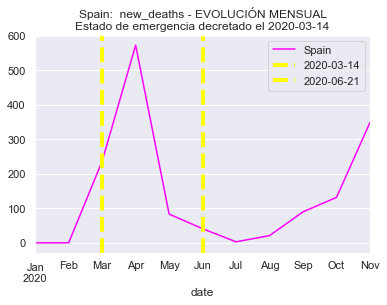


 United States 



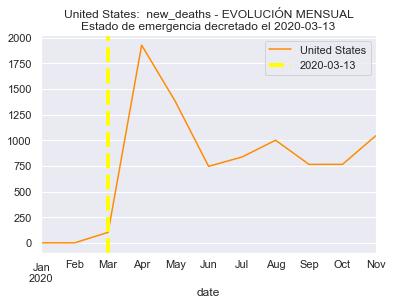


 new_deaths_smoothed 


 France 



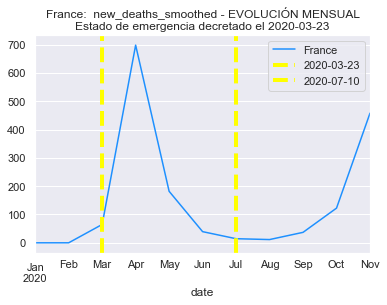


 India 



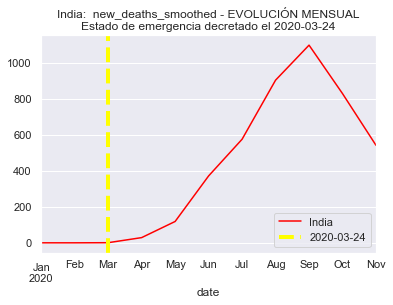


 Peru 



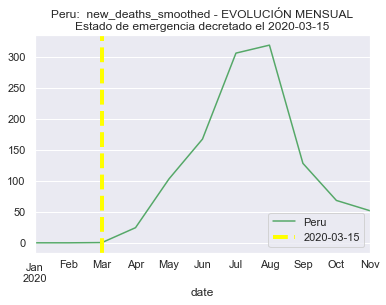


 Spain 



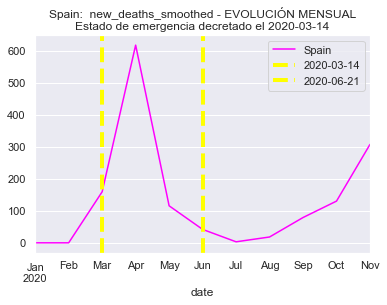


 United States 



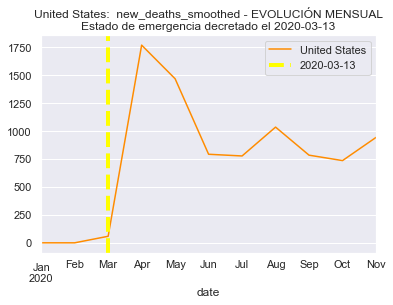


 total_cases_per_million 


 France 



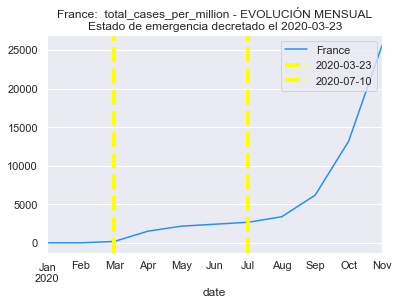


 India 



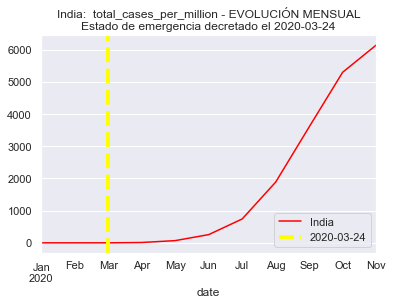


 Peru 



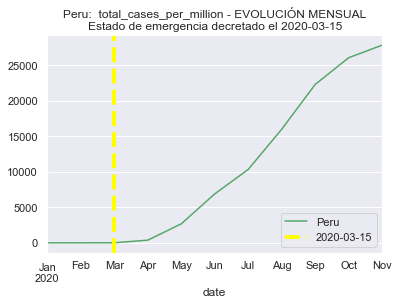


 Spain 



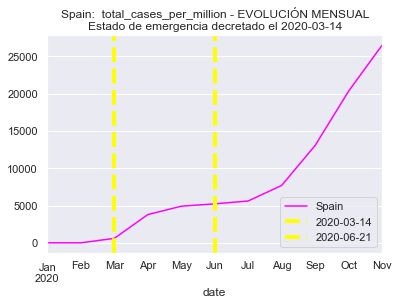


 United States 



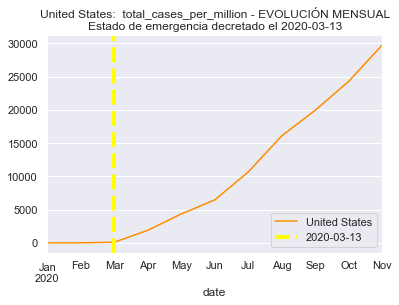


 new_cases_per_million 


 France 



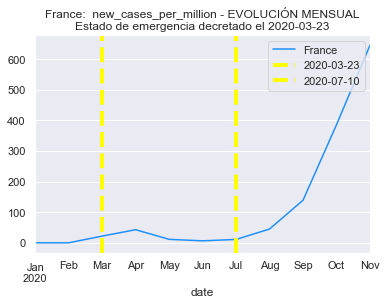


 India 



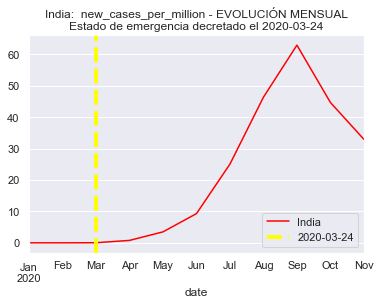


 Peru 



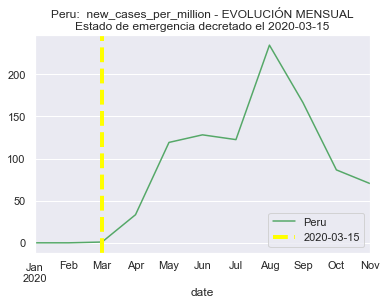


 Spain 



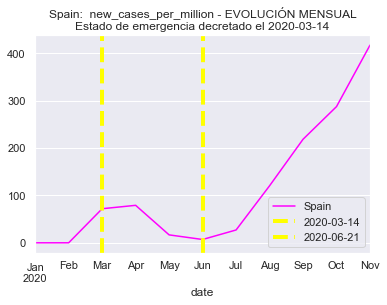


 United States 



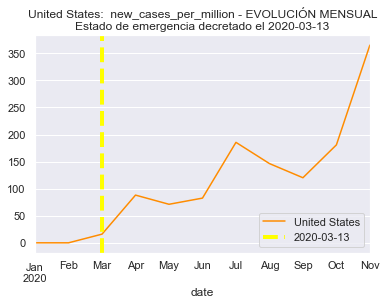


 new_cases_smoothed_per_million 


 France 



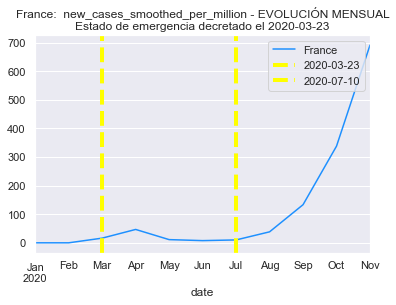


 India 



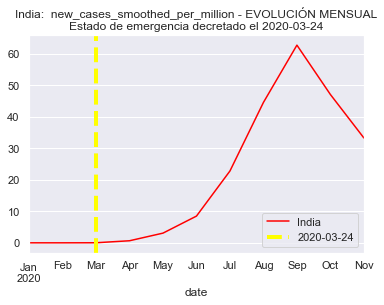


 Peru 



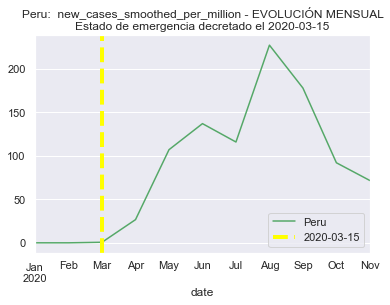


 Spain 



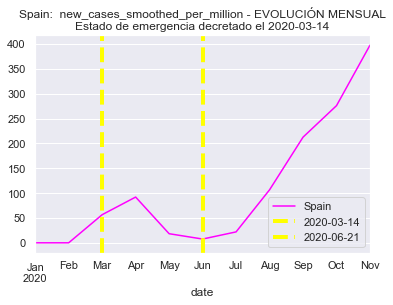


 United States 



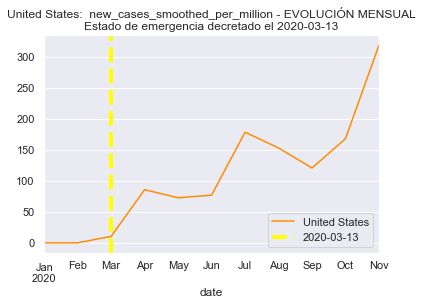


 total_deaths_per_million 


 France 



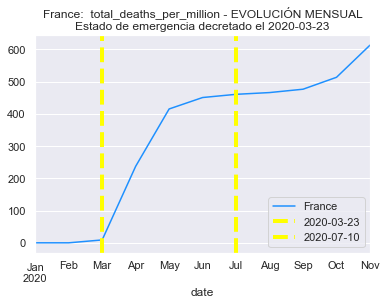


 India 



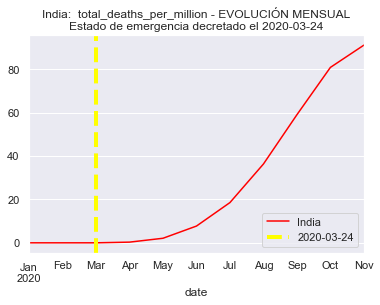


 Peru 



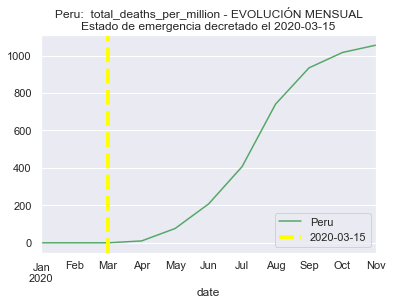


 Spain 



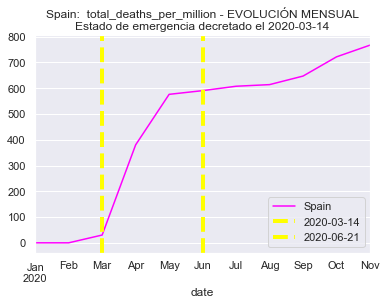


 United States 



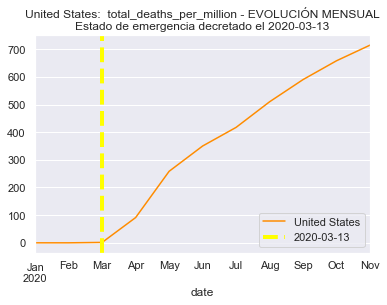


 new_deaths_per_million 


 France 



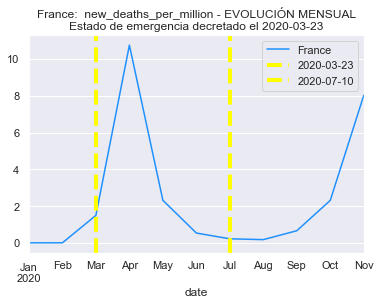


 India 



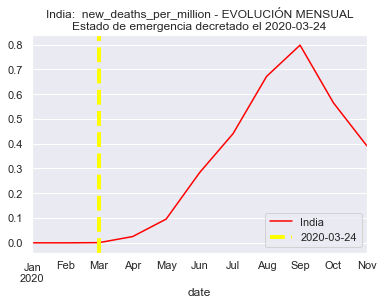


 Peru 



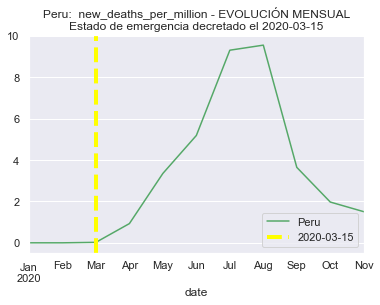


 Spain 



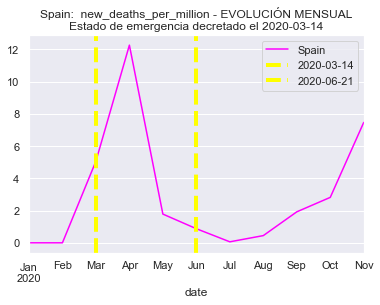


 United States 



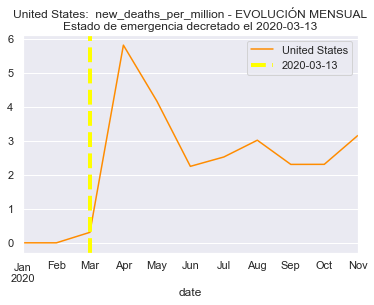


 new_deaths_smoothed_per_million 


 France 



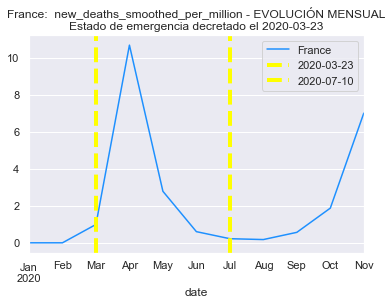


 India 



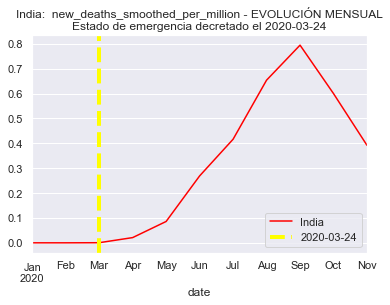


 Peru 



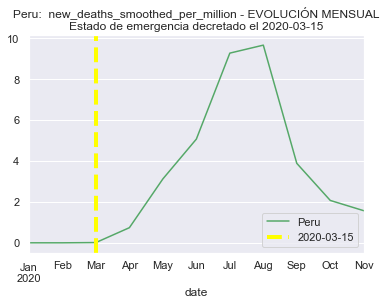


 Spain 



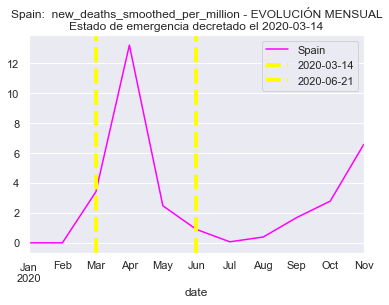


 United States 



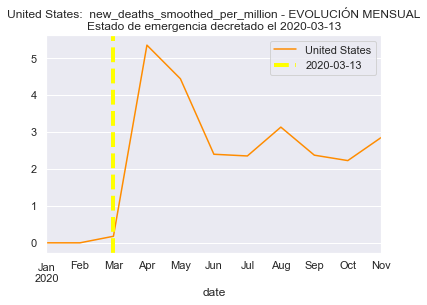

In [27]:
fechas_emergencia = [["2020-03-23","2020-07-10"],["2020-03-24"],["2020-03-15"],["2020-03-14","2020-06-21"],["2020-03-13"]]
vsn.emergencias_mes(dataframe=df,emergencia=fechas_emergencia,colores_paises=colores_paises) 

### Función total_paises de visualization_tb para comprobar el puesto de España respecto al resto de los países en cuanto al total de muertos y casos (absolutos y por millón de habitantes).
La función toma como parámetros el dataframe a analizar, las columnas que vamos a analizar (en este caso las referentes a localización y totales) y el diccionario con los colores correspondientes a cada país.
Recorremos las columnas con un for, hacemos una pivot table para cada valor y seleccionamos el penúltimo (porque hemos comprobado que el último registro a veces contiene valores nulos porque no se tienen datos actualizados).

La función automatiza el proceso de generar los 4 gráficos, primero muestra cada uno de ellos y después los guarda en la carpeta paises_juntos dentro de la carpeta plots de resources añadiendo el prefijo "barras_" y el nombre de cada columna analizada.



 total_cases 



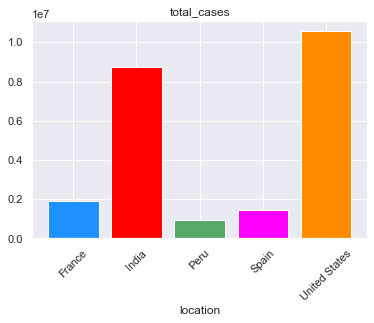


 total_deaths 



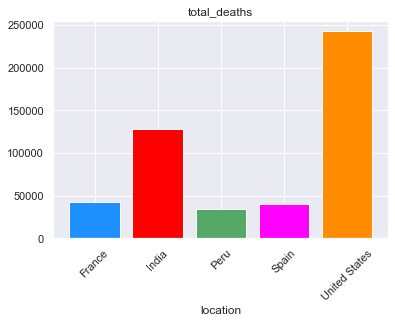


 total_cases_per_million 



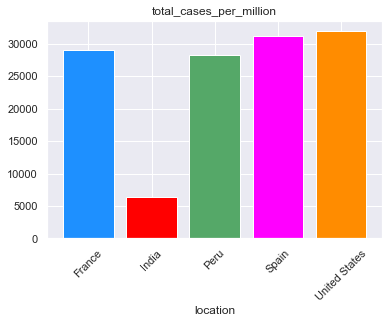


 total_deaths_per_million 



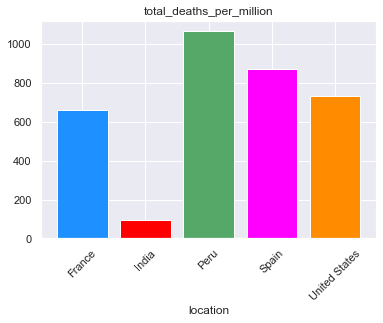

In [28]:
columnas=[0,1,4,7,10]
vsn.total_paises(dataframe=df,cols=columnas,colores_paises=colores_paises)

### Función total_paises_orden de visualization_tb igual que la función totales_paises pero ordenando los países de forma descendente.
Al estandarizar la función se pierde el color específico de cada país pero las posiciones de cada uno quedan más claras.
De nuevo la función automatiza el proceso de generar y guardar los 4 gráficos. Primero muestra cada gráfico y después los guarda en la carpeta paises_juntos dentro de la carpeta plots de resources añadiendo el prefijo "barras_orden_" y el nombre de cada columna analizada. @CristiDatas


 total_cases 



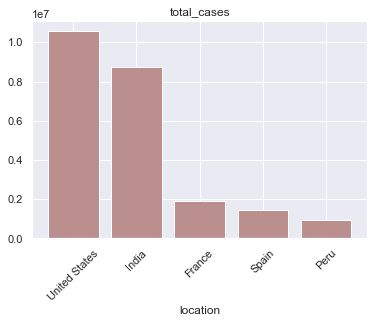


 total_deaths 



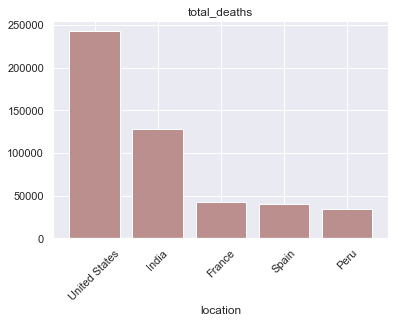


 total_cases_per_million 



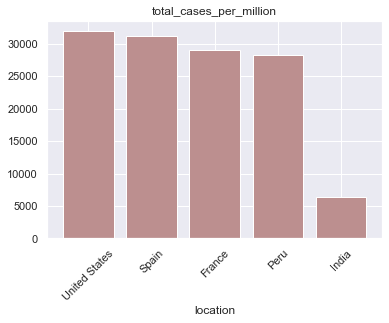


 total_deaths_per_million 



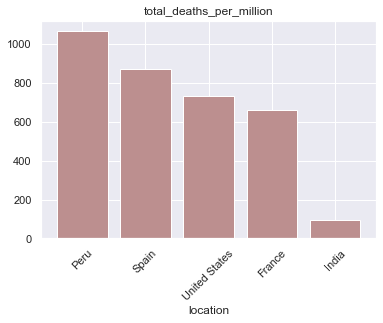

In [29]:
columnas=[0,1,4,7,10]
vsn.total_paises_orden(dataframe=df,cols=columnas)